In [1]:
globals().clear()
from dataset import *
from models import *
from visualisation import *
import os

In [2]:
import subprocess
import re

def get_gpu_memory():
    # Runs the nvidia-smi command to get GPU details
    result = subprocess.check_output(['nvidia-smi', '--query-gpu=memory.free,memory.total', '--format=csv,nounits,noheader'])
    # Decode the result and split it into lines
    result = result.decode('utf-8').strip().split('\n')
    # Parse the result lines
    free_memory = []
    for line in result:
        free, total = map(int, line.split(', '))
        free_memory.append(f"{free} MiB free out of {total} MiB")
    return free_memory

free_memory = get_gpu_memory()
for i, mem in enumerate(free_memory):
    print(f"GPU {i}: {mem}")

GPU 0: 13 MiB free out of 24576 MiB
GPU 1: 23660 MiB free out of 24576 MiB
GPU 2: 23658 MiB free out of 24576 MiB
GPU 3: 23660 MiB free out of 24576 MiB


In [3]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'  # use GPU 0

In [6]:
torch.cuda.empty_cache()

In [7]:
fMRI, videos = load_data()

Load data:
fMRI: OK
Video: OK
---


ToClaireFromSonny


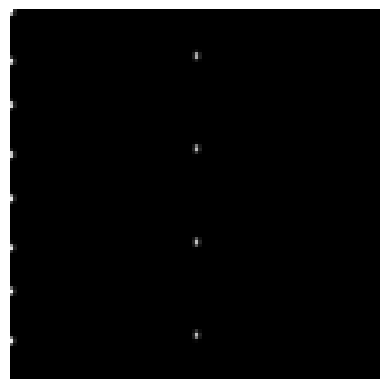

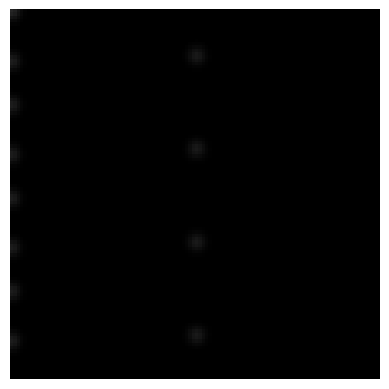

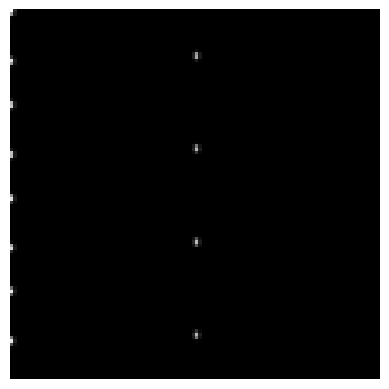

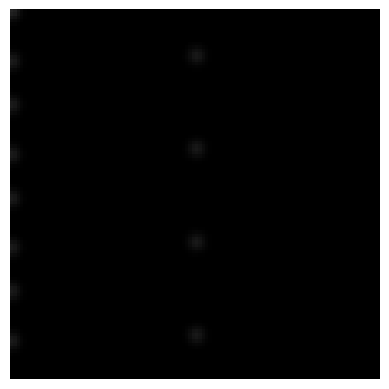

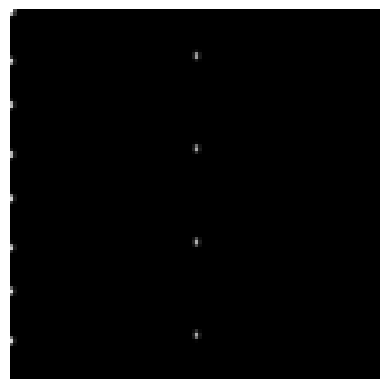

...

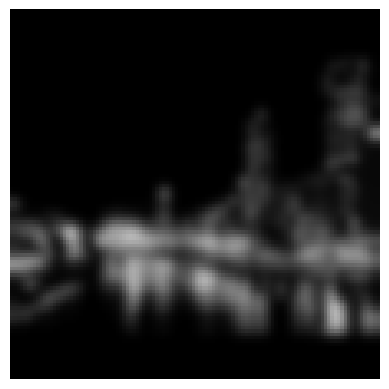

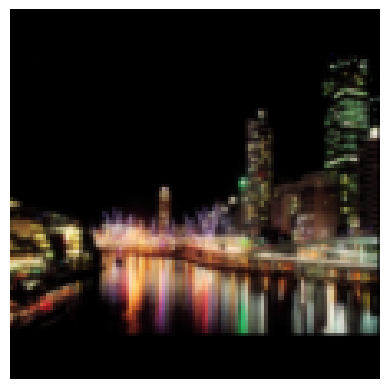

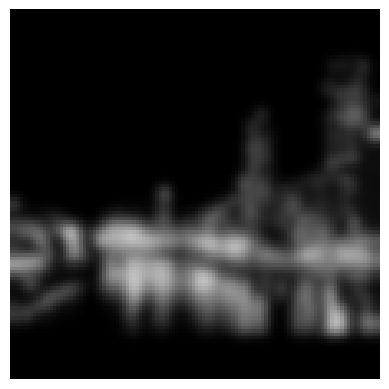

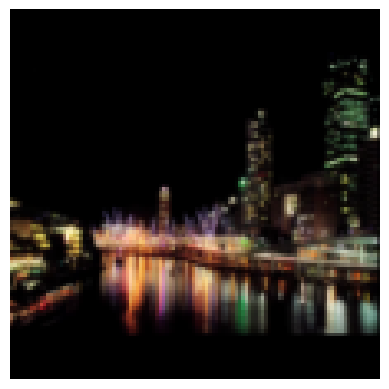

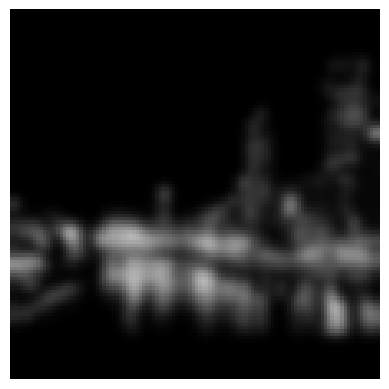

In [25]:
def preprocess_images(images, blur):
    """
    Convert images to grayscale and then apply Gaussian blurring.
    
    :param images: A numpy array of shape (n_frames, 3, width, height)
    :return: Preprocessed images, now in grayscale and blurred
    """
    # Initialize an empty array for the preprocessed images
    preprocessed = np.empty((images.shape[0], images.shape[2], images.shape[3]), dtype='float32')

    for i, img in enumerate(images):
        # Convert RGB to Grayscale
        gray = cv2.cvtColor(img.transpose(1, 2, 0), cv2.COLOR_RGB2GRAY)
        # Apply Gaussian Blurring
        preprocessed[i] = cv2.GaussianBlur(gray, (blur, blur), 0)

    preprocessed = torch.from_numpy(preprocessed)
    preprocessed = preprocessed.unsqueeze(1).repeat(1, 3, 1, 1)
    return preprocessed

key = 'ToClaireFromSonny'
v = videos[key]
g = preprocess_images(v[...,16], 9).numpy()
print(key)
for i in range(v.shape[0]):
    plt.imshow(np.transpose(v[i,:,:,:,16], (1, 2, 0)))
    plt.axis('off')
    plt.show()

    plt.imshow(np.transpose(g[i,:,:,:], (1, 2, 0)))
    plt.axis('off')
    plt.show()

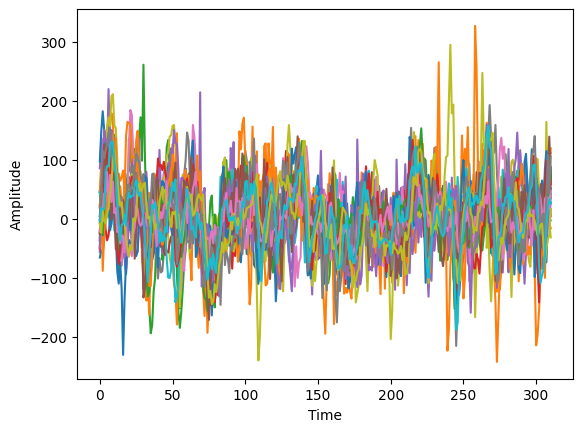

In [17]:
subject_list = os.listdir('fMRIs')
subject_list.remove('average')
voxel = 2590
for s in subject_list:
    fMRI = load_masked_fMRI(subject = s)['Chatter']
    plt.plot(fMRI[:, voxel])

plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.show()

In [21]:
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        
        self.fc = nn.Linear(4330, 14*14*48)
        
        # Convolutional layer 1
        self.conv1 = nn.ConvTranspose2d(48, 48, kernel_size=5, stride=1, padding=2)
        self.up1 = nn.Upsample(scale_factor=2, mode='nearest')
        self.bn1 = nn.BatchNorm2d(48)

        # Convolutional layer 2
        self.conv2 = nn.ConvTranspose2d(48, 48, kernel_size=5, stride=1, padding=2)
        self.up2 = nn.Upsample(scale_factor=2, mode='nearest')
        self.bn2 = nn.BatchNorm2d(48)

        # Convolutional layer 3
        self.conv3 = nn.ConvTranspose2d(48, 48, kernel_size=5, stride=1, padding=2)
        self.up3 = nn.Upsample(scale_factor=2, mode='nearest')
        self.bn3 = nn.BatchNorm2d(48)
        
        # Convolutional layer 4
        self.conv4 = nn.ConvTranspose2d(48, 3, kernel_size=5, stride=1, padding=2)
        #self.up4 = nn.Upsample(scale_factor=2, mode='nearest')  #other solution instead of removing the upsample is to put a padding of 30 but doesn't seem right
        self.bn4 = nn.BatchNorm2d(3)

    def forward(self, x):
        print(x.shape)
        
        # Fully connected layer
        x = self.fc(x)
        x = F.relu(x)
        x = x.view(-1, 48, 14, 14) # Reshape to (batch_size, channels, H, W)
        print(x.shape)
        
        # First conv layer + ReLU + Upsample + BatchNorm
        x = self.conv1(x)
        x = F.relu(x)
        x = self.up1(x)
        x = self.bn1(x)
        print(x.shape)

        # Second conv layer + ReLU + Upsample + BatchNorm
        x = self.conv2(x)
        x = F.relu(x)
        x = self.up2(x)
        x = self.bn2(x)
        print(x.shape)

        # third conv layer + ReLU + Upsample + BatchNorm
        x = self.conv3(x)
        x = F.relu(x)
        x = self.up3(x)
        x = self.bn3(x)
        print(x.shape)
        
        # fourth conv layer + sigmoid + Upsample + BatchNorm
        x = self.conv4(x)
        x = torch.sigmoid(x)
        #x = self.up4(x)
        x = self.bn4(x)
        print(x.shape)
        
        return x

In [24]:
a = torch.rand(50, 4330)
m = Decoder()
b = m(a)

torch.Size([50, 4330])
torch.Size([50, 48, 14, 14])
torch.Size([50, 48, 28, 28])
torch.Size([50, 48, 56, 56])
torch.Size([50, 48, 112, 112])
torch.Size([50, 3, 112, 112])


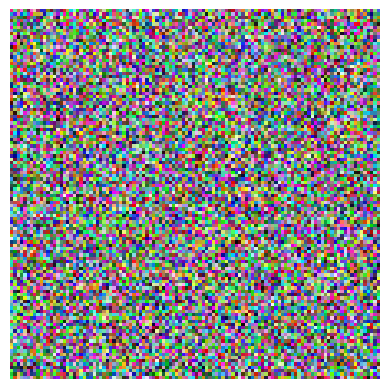

In [27]:
c = normalize(np.random.rand(112, 112, 3))
plt.imshow(c)
plt.axis('off')
plt.show()